In [1]:
from ba_utils.path import find_path, search_alpha, find_path_cosine
from ba_utils.model import CLIP, Generator
from ba_utils.data import get_dataset
from ba_utils.umap import get_reducer, get_reduced
from ba_utils.show import grid, grid_all
from ba_utils.experiments import interpolation_pipe
from ba_utils.vector import interpolate_slerp


from math import ceil
import numpy as np
import joblib
data_dir = 'data/dump/results/'

In [2]:
clip = CLIP()
gen = Generator()

In [3]:
reducer_all_portrait = get_reducer('portrait')
reduced_all_portrait = get_reduced('portrait')
text_portrait, pooled_portrait = get_dataset('portrait')

reducer_all_animal = get_reducer('animal')
reduced_all_animal = get_reduced('animal')
text_animal, pooled_animal = get_dataset('animal')

In [4]:
prompts4, seeds4 = in4 = joblib.load(data_dir + 'in4.pkl')
prompts5, seeds5 = in5 = joblib.load(data_dir + 'in5.pkl')

In [5]:
prompts4

['A portrait photograph of an astronaut floating in space next to a planet',
 'A portrait of a seasoned fisherman holding a large catch, with a rugged, weather-beaten face']

In [6]:
prompts5

['A a photograph sturdy rhinoceros standing in a muddy watering hole, with a background of sparse trees and a clear sky',
 'A photograph of a wise-looking owl perched on a tree branch at night, with a full moon and twinkling stars in the background']

In [7]:

goal = 5
toloerance= 3


paths_portrait = []
alphas_portrait = []

start_portrait, dest_portrait = clip.embed(prompts4).pooler_output

for reducer, reduced in zip(reducer_all_portrait, reduced_all_portrait):
    path, alpha = search_alpha(reducer.transform(start_portrait.cpu().unsqueeze(0)).squeeze(), reducer.transform(dest_portrait.cpu().unsqueeze(0)).squeeze(), reduced, find_path, goal=goal, tolerance=toloerance)
    paths_portrait.append(path)
    alphas_portrait.append(alpha)

paths_animal = []
alphas_animal = []
start_animal, dest_animal = clip.embed(prompts5).pooler_output

for reducer, reduced in zip(reducer_all_animal, reduced_all_animal):
    path, alpha = search_alpha(reducer.transform(start_animal.cpu().unsqueeze(0)).squeeze(), reducer.transform(dest_animal.cpu().unsqueeze(0)).squeeze(), reduced, find_path, goal=goal, tolerance=toloerance)
    paths_animal.append(path)
    alphas_animal.append(alpha)

no valid points left - took 73 reference points
Alpha: 0.4000 	 Length: 73
no valid points left - took 65 reference points
Alpha: 0.3000 	 Length: 65
no valid points left - took 60 reference points
Alpha: 0.2000 	 Length: 60
no valid points left - took 46 reference points
Alpha: 0.1000 	 Length: 46
no valid points left - took 33 reference points
Alpha: 0.0000 	 Length: 33
no valid points left - took 0 reference points
Alpha: 0.0500 	 Length: 0
no valid points left - took 22 reference points
Alpha: 0.0250 	 Length: 22
no valid points left - took 15 reference points
Alpha: 0.0000 	 Length: 15
no valid points left - took 0 reference points
Alpha: 0.0125 	 Length: 0
no valid points left - took 12 reference points
Alpha: 0.0063 	 Length: 12
no valid points left - took 8 reference points
Final alpha: 0.0063 	 Length: 8

no valid points left - took 9 reference points
Alpha: 0.4000 	 Length: 9
no valid points left - took 9 reference points
Alpha: 0.3000 	 Length: 9
no valid points left - took 

In [8]:
text_portrait[paths_portrait[0]]

array(['picture of military personnel  - Portrait of US Marine Corps soldier with father saluting over brown background - JPG',
       '1960s Portrait Man Policeman Traffic Cop Blowing Whistle',
       '"Close Up Portrait of Actor in Astronaut Suit on the Set of the Movie ""2001: A Space Odyssey"" Premium Photographic Print by Dmitri Kessel"',
       'Portrait of unarmed woman with camouflage. Young female soldier observe with binoculars. War military army people concept',
       'stock photo of buccaneer  - Portrait of young man in a pirate costume with pistol - JPG',
       'Self Portrait as a Lute Player',
       'Portfolio of KevinLJ © Kevin Landwer-Johan Trumpet Player Portrait',
       'English: Portrait of Bette Greene in her Boston, MA home surrounded by original artwork inspired by her books.'],
      dtype=object)

In [9]:
text_portrait[paths_portrait[1]]

array(['Airplane Madness : War for Glory Portrait Edition (Shooter & Racing)',
       'Self Portrait Photograph - A Pilot Takes A Self Portrait by Stocktrek Images',
       'Portrait of a little pilot Stock Photography',
       "Little Aviator Brisbane Children's Portrait",
       'Victorious mature person with cash money - Portrait of a...'],
      dtype=object)

In [10]:
text_portrait[paths_portrait[2]]

array(['Self Portrait Photograph - A Pilot Takes A Self Portrait by Stocktrek Images',
       'Portrait of a bald writer'], dtype=object)

In [11]:
text_animal[paths_animal[0]]

array(['Care Bears Grumpy Bear Adult Slippers',
       'Image intitulée Tame Your Guinea Pig Step 9',
       'Banded Hairstreak Butterfly Art Poster',
       'LEGO Disney 43179 Mickey Mouse And Minnie Mouse Buildable Characters 9'],
      dtype=object)

In [12]:
text_animal[paths_animal[1]]

array(['2019 Avenge USSSA Slowpitch Softball Bat - Endloaded',
       'Vintage French Parrot No. 5 Art Print',
       'Kitty Hawk Kites Watersports Center',
       'Upon opening the fourth seal, another horse appeared, of a pale color. The rider was Basement Cat the king of terrors.',
       'Spaghetti with Creamy Crab & Watercress Sauce',
       'Rivers Edge Products Deer Antler Single Switch Electrical Cover Plate CVR',
       '40 Days 40 Nights (Sgt Major Crane Novels) (Kindle Edition) recently tagged',
       'Welcome Penguin Card'], dtype=object)

In [13]:
text_animal[paths_animal[2]]

array(['The Yellow Cow Book - Arabic',
       'Border Models 1:35 Leopard 2A5/A6 Early & 2A5/2A6 Late 3 in 1 Military Model Kit',
       'Christmas Tree Decoration Personalised Ginger Cat',
       'Megle the Magellan Horned Owl',
       '2019 Avenge USSSA Slowpitch Softball Bat - Endloaded'],
      dtype=object)

In [14]:
portrait_path_cosine = find_path_cosine(start_portrait, dest_portrait, pooled_portrait, gpu_id=0, max_sim=1)
text_portrait[portrait_path_cosine]

no valid points left - took 18 reference points


array(['Portrait of astronaut in space suit',
       'Portrait of a boy dressed up as spaceman',
       'Portrait of boy dressed as superhero',
       'Artwork Portrait of a boy', 'Portrait of Young Boy.',
       'Portrait of a young man \uf096',
       'Portrait of a young Man standing',
       'Half-Length Portrait of a Young Man',
       'Portrait of a man, half-length',
       'Half-length Portrait of a bearded Man',
       'Elderly man with long beard, portrait',
       'Portrait of an elderly man', 'Portrait of an Elderly Man',
       'Portrait of homeless man',
       'Portrait of male street vendor holding food',
       'Portrait of a young man carrying firewood',
       'Portrait of a young man holding a fishing rod',
       'Portrait of happy man holds a fishing rod and a bait'],
      dtype=object)

In [15]:
animal_path_cosine = find_path_cosine(start_animal, dest_animal, pooled_animal, gpu_id=0, max_sim=1)
text_animal[animal_path_cosine]

no valid points left - took 9 reference points


array(['Bear standing in a field with trees and mountains in the background',
       'Koala on a tree with bush green background',
       'Koala on a tree with bush — Stock Photo',
       'Koala a bear sits on a branch of a tree — Stock Photo',
       'Picture of Koala sitting on branch', 'Owl On Tree Branch',
       'Owl on Branch with Full Moon',
       'Owl night - Owl sitting upon a tree branch with a large moon...',
       'Owl On A Tree At Night'], dtype=object)

In [16]:
prompts_portrait = [prompts4[0]] + [list(text_portrait[portrait_path_cosine])[-4]] + [prompts4[1]]
prompts_portrait

['A portrait photograph of an astronaut floating in space next to a planet',
 'Portrait of male street vendor holding food',
 'A portrait of a seasoned fisherman holding a large catch, with a rugged, weather-beaten face']

In [17]:
prompts_animal = [prompts5[0]] + [list(text_animal[animal_path_cosine])[4]] + [prompts5[1]]
prompts_animal

['A a photograph sturdy rhinoceros standing in a muddy watering hole, with a background of sparse trees and a clear sky',
 'Picture of Koala sitting on branch',
 'A photograph of a wise-looking owl perched on a tree branch at night, with a full moon and twinkling stars in the background']

initializing CLIP
initializing Gen
info: used lerp for 1 out of 77 embeddings
info: used lerp for 1 out of 77 embeddings


  0%|          | 0/26 [00:00<?, ?it/s]

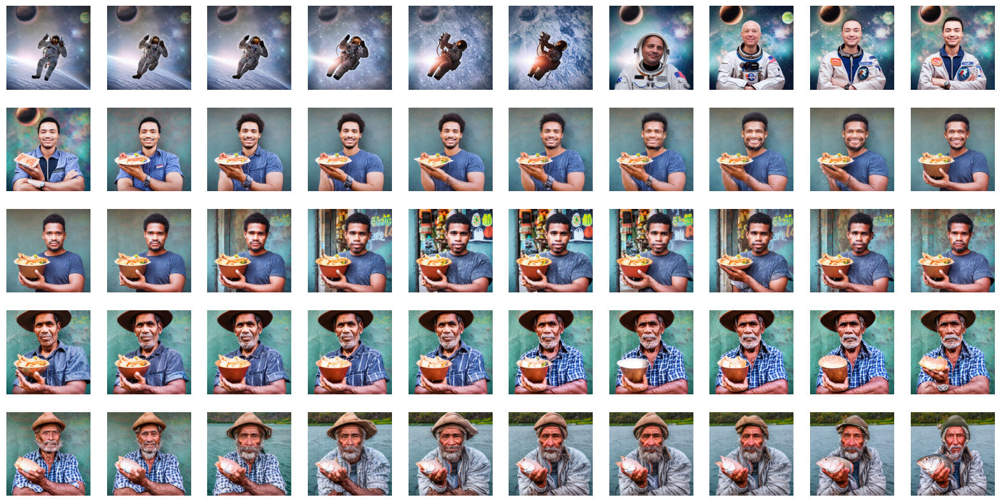

info: used lerp for 1 out of 77 embeddings
info: used lerp for 1 out of 77 embeddings


  0%|          | 0/26 [00:00<?, ?it/s]

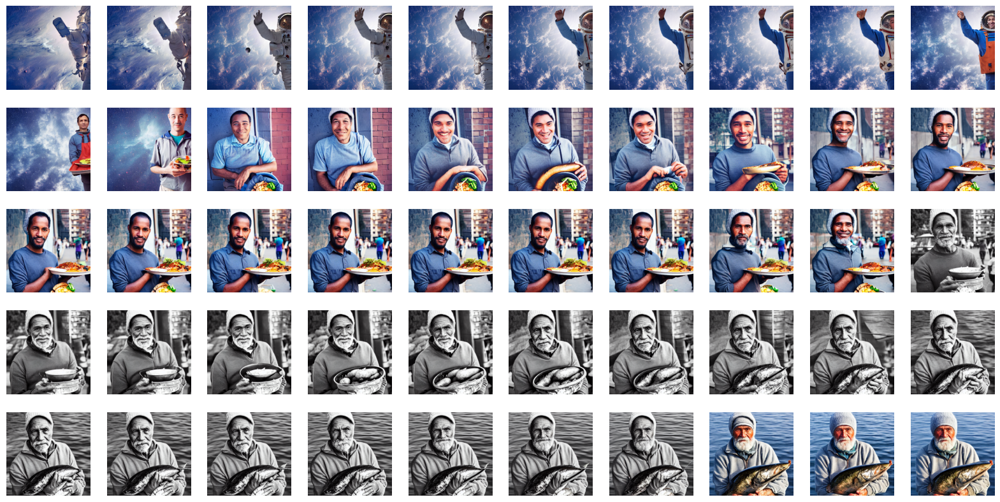

info: used lerp for 1 out of 77 embeddings
info: used lerp for 1 out of 77 embeddings


  0%|          | 0/26 [00:00<?, ?it/s]

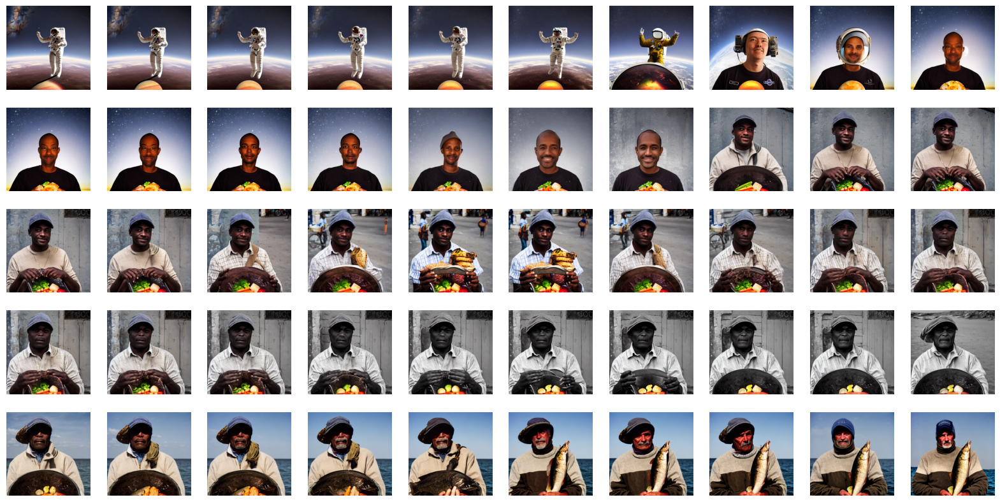

info: used lerp for 1 out of 77 embeddings
info: used lerp for 1 out of 77 embeddings


  0%|          | 0/26 [00:00<?, ?it/s]

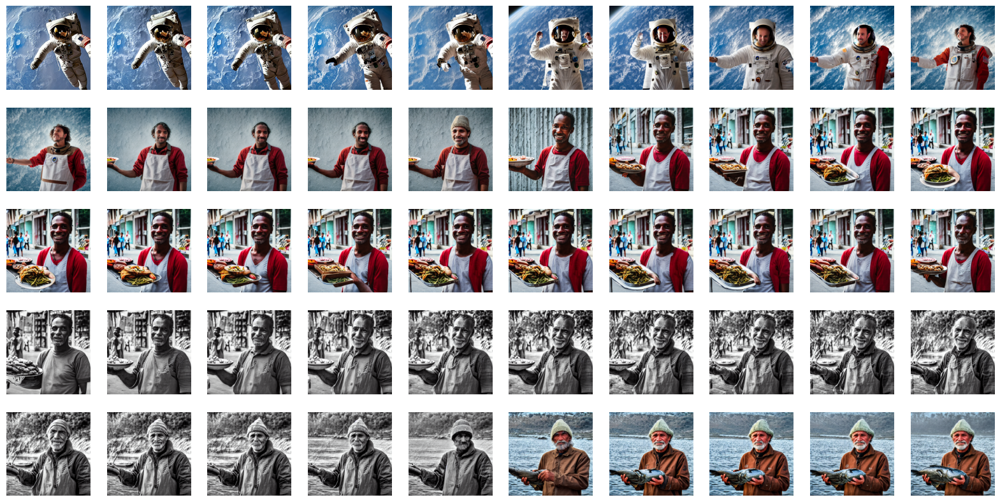

In [18]:
result_portrait = []
for seed in seeds4:
    result_portrait.append(interpolation_pipe(prompts_portrait, interpolate_slerp, seed=seed, n_steps=ceil(50/(len(prompts_portrait)-1)),n_cols=10))

info: used lerp for 1 out of 77 embeddings
info: used lerp for 1 out of 77 embeddings


  0%|          | 0/26 [00:00<?, ?it/s]

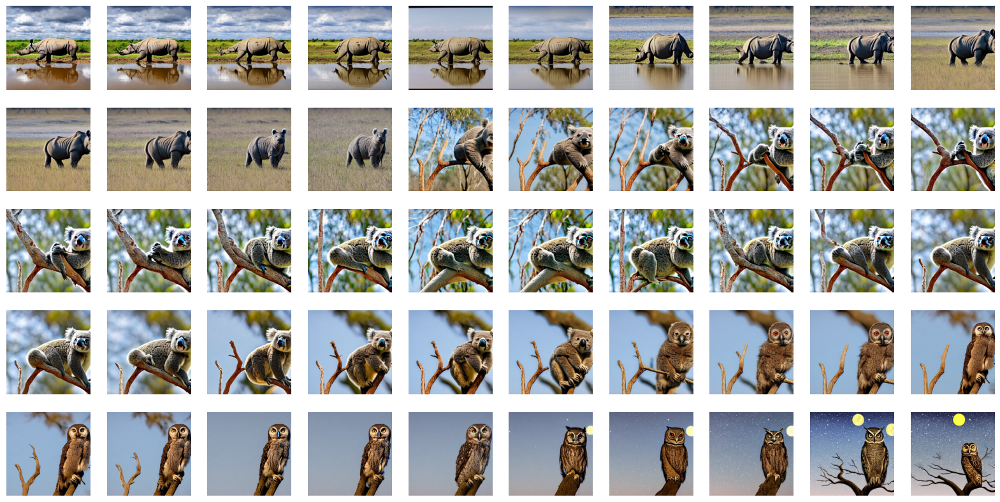

info: used lerp for 1 out of 77 embeddings
info: used lerp for 1 out of 77 embeddings


  0%|          | 0/26 [00:00<?, ?it/s]

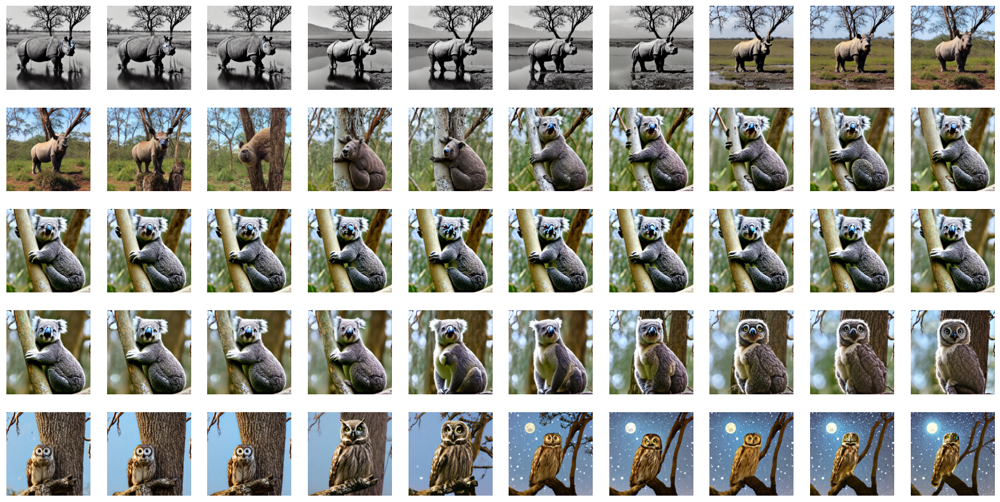

info: used lerp for 1 out of 77 embeddings
info: used lerp for 1 out of 77 embeddings


  0%|          | 0/26 [00:00<?, ?it/s]

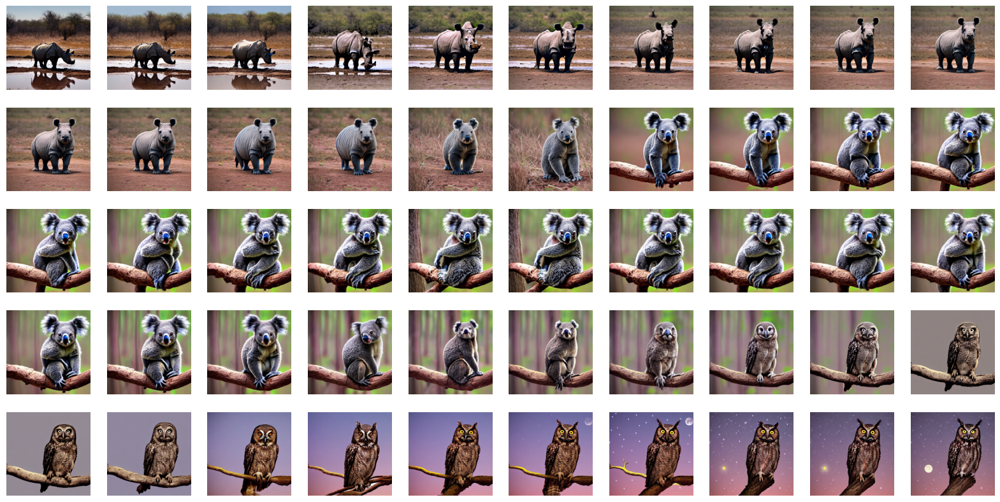

info: used lerp for 1 out of 77 embeddings
info: used lerp for 1 out of 77 embeddings


  0%|          | 0/26 [00:00<?, ?it/s]

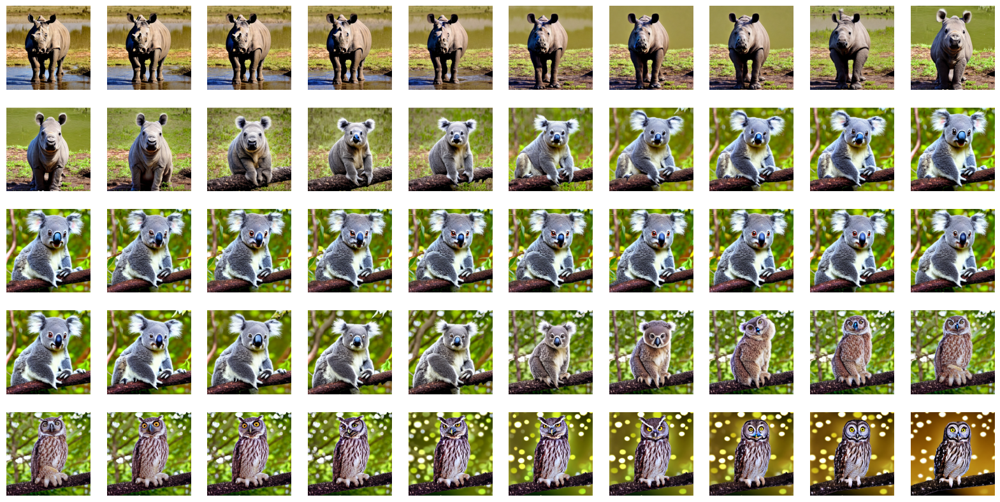

In [19]:
result_animal = []
for seed in seeds5:
    result_animal.append(interpolation_pipe(prompts_animal, interpolate_slerp, seed=seed, n_steps=ceil(50/(len(prompts_animal)-1)), n_cols=10))

In [22]:
joblib.dump(result_portrait, data_dir + 'out4_semiautomatic.pkl')
joblib.dump(result_animal, data_dir + 'out5_semiautomatic.pkl')

['data/dump/results/out5_semiautomatic.pkl']